In [1]:
import funcs
import summary
import warnings

import numpy as np
import pandas as pd 
import pandas_gbq as gbq
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
colors = px.colors.qualitative.Plotly

from mlxtend.classifier import EnsembleVoteClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix 
from sklearn.metrics import matthews_corrcoef, roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler

/Users/jackrisse/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/Users/jackrisse/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/Users/jackrisse/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/Users/jackrisse/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/Users/jackrisse/anaconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicat

In [2]:
warnings.filterwarnings('ignore') # makes warnings not show

In [3]:
# query to extract the requied data for the home teams
h_query = """
          SELECT h_points_game, h_field_goals_made, h_field_goals_att, 
                 h_field_goals_pct, h_three_points_made, h_three_points_att,
                 h_three_points_pct, h_two_points_made, h_two_points_att, 
                 h_two_points_pct, h_free_throws_made, h_free_throws_att,
                 h_free_throws_pct, h_offensive_rebounds, h_defensive_rebounds,
                 h_rebounds, h_assists, h_turnovers, h_steals, h_blocks, 
                 h_assists_turnover_ratio, h_personal_fouls, h_fast_break_pts,
                 h_second_chance_pts, h_team_turnovers, h_points_off_turnovers 
          FROM `bigquery-public-data.ncaa_basketball.mbb_games_sr` 
          """

# query to extract the requied data for the away teams
a_query = """
          SELECT a_points_game, a_field_goals_made, a_field_goals_att, 
                 a_field_goals_pct, a_three_points_made, a_three_points_att,
                 a_three_points_pct, a_two_points_made, a_two_points_att, 
                 a_two_points_pct, a_free_throws_made, a_free_throws_att,
                 a_free_throws_pct, a_offensive_rebounds, a_defensive_rebounds,
                 a_rebounds, a_assists, a_turnovers, a_steals, a_blocks, 
                 a_assists_turnover_ratio, a_personal_fouls, a_fast_break_pts,
                 a_second_chance_pts, a_team_turnovers, a_points_off_turnovers 
          FROM `bigquery-public-data.ncaa_basketball.mbb_games_sr` 
          """

projID = 'mod5-project-259518' # to pull from a BigQuery dataset you need a project ID

In [4]:
# instantiates dataframe for the away team stats
a_df = pd.read_gbq(a_query, project_id=projID, dialect='standard') 

# instantiates dataframe for the home team stats
h_df = pd.read_gbq(h_query, project_id=projID, dialect='standard')

In [5]:
"""
Creating a fucntion here could've been helpful
but since it was just a unique case, a function
wasn't created. Creating a new column to dataframes
representing whether or not the team won and the 
target feature.
"""

# instantiates list for the observations of the home team winning
home = [] 

# instantiates list for the observations of the away team winning
away = []

# iterates over the away and home scores for each game
for a, h in zip(a_df['a_points_game'], h_df['h_points_game']): 
    
    if h > a: # checks which teams score was larger
        
        # if home team won
        home.append(1) # a 1 is appended to home list
        away.append(0) # a 0 is added to away list
    
    else:
        
        #if away team won
        away.append(1) # a 1 is added to away list
        home.append(0) # a 0 is added to home list
        
home = np.array(home) # turns home list into a numpy array
away = np.array(away) # turns away list into a numpy array

In [6]:
# adds the column to the corresponding dataframe
a_df['W/L'] = pd.Series(away) 
h_df['W/L'] = pd.Series(home) 

In [7]:
# creates list of two list that take out unneeded characters for the column names
new_names = [[col.replace('a', '', 1) for col in a_df.columns], 
             [col.replace('h', '', 1) for col in h_df.columns]]

# replaces the unwanted names
a_df.columns = new_names[0] 
h_df.columns = new_names[1] 

df = h_df.append(a_df, ignore_index=True, sort=False) # instantiates preprocessed dataframe

In [8]:
# takes off the underscores before the column names
df.columns = [col.replace('_', '', 1) for col in df.columns]
df.head() # making sure everything is a okay

,points_game,field_goals_made,field_goals_att,field_goals_pct,three_points_made,three_points_att,three_points_pct,two_points_made,two_points_att,two_points_pct,...,turnovers,steals,blocks,assists_turnover_ratio,personal_fouls,fast_break_pts,second_chance_pts,team_turnovers,points_off_turnovers,W/L
0,73,26.0,61.0,42.6,10.0,19.0,52.6,16.0,42.0,0.381,...,22.0,6.0,2.0,0.77,25.0,14.0,3.0,0.0,19.0,0
1,72,24.0,69.0,34.8,8.0,33.0,24.2,16.0,36.0,0.444,...,14.0,7.0,1.0,0.71,21.0,6.0,13.0,0.0,9.0,0
2,93,34.0,67.0,50.7,13.0,29.0,44.8,21.0,38.0,0.553,...,12.0,8.0,0.0,1.58,17.0,6.0,11.0,0.0,32.0,1
3,76,26.0,47.0,55.3,9.0,13.0,69.2,17.0,34.0,0.500,...,16.0,9.0,4.0,1.13,23.0,4.0,2.0,0.0,15.0,1
4,57,19.0,62.0,30.6,4.0,21.0,19.0,15.0,41.0,0.366,...,8.0,7.0,0.0,1.38,20.0,4.0,8.0,1.0,12.0,0


In [9]:
df.drop_duplicates(inplace=True) # dropping any duplicates
df.dropna(inplace=True) # dropping observations with NaN values
pp.ProfileReport(df) # print a great visual and info about each column in dataframe

In [10]:
df.reset_index(inplace=True) # resets the index because rows were dropped

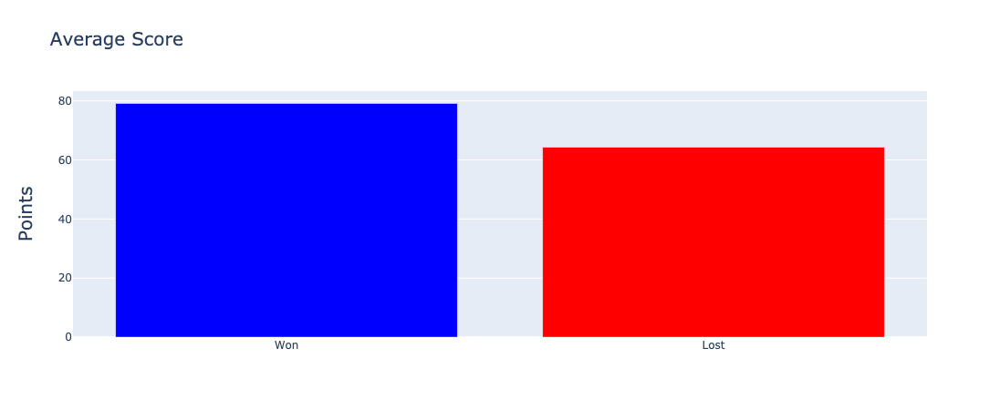

In [11]:
# instantiates variables for observations that won and lost
won = df['points_game'].loc[df['W/L']==1].mean() 
lost = df['points_game'].loc[df['W/L']==0].mean()

# creats bar plots for average score of the winning team and losing team
data = go.Bar(name='Average Points',
              x=['Won','Lost'], 
              y=[won, lost], 
              hovertext=['About 79 points', 'About 64 points'],
              marker={'color':['blue', 'red']})

# creates all the meta and styling data for the plot
layout = go.Layout(title='Average Score',
                   titlefont_size=20,
                   barmode='group',
                   yaxis={'title':'Points',
                          'titlefont_size':20})

# creates the figure for the plot
fig = go.Figure(data=data, layout=layout)
fig.show() # renders the plot to show

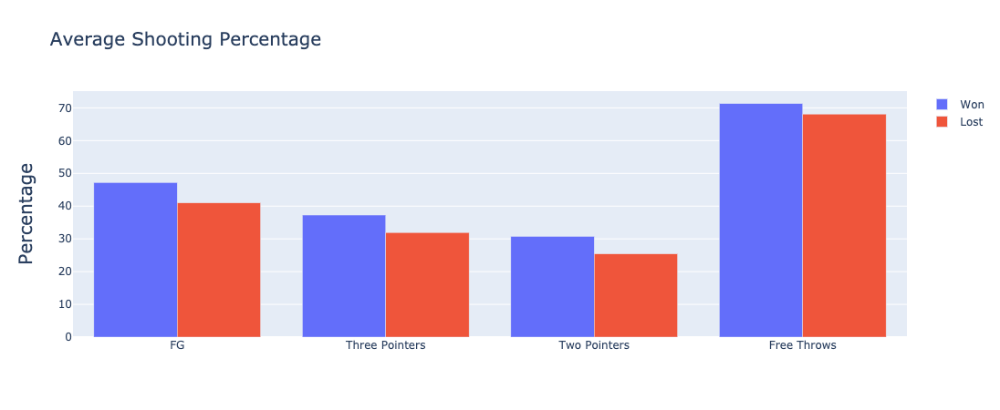

In [12]:
w = [] # instantiates empty list for each average for each stat of the winning team
l = [] # instantiates empty list for each average for each stat of the losing team

# iterates over the required stat columns
for col in ['field_goals_pct', 'three_points_pct', 'two_points_pct', 'free_throws_pct']:
    won = df[col].loc[df['W/L']==1].mean() # finds the mean of the winning team
    lost = df[col].loc[df['W/L']==0].mean() # finds the mean of the losing team
    w.append(won) # adds the mean to the win list
    l.append(lost) # adds the mean to the lost list

# 1. go.Bar creates bars for each stat of the winning team
# 2. go.Bar creates bats for each stat of the losing team
data = [go.Bar(name='Won',
               x=['FG', 'Three Pointers', 'Two Pointers', 'Free Throws'],
               y=w,
               hovertext=['About 47%','About 37%','About 31%', 'About 71%']),
        go.Bar(name='Lost',
               x=['FG', 'Three Pointers', 'Two Pointers', 'Free Throws'],
               y=l,
               hovertext=['about 41%','About 32%','About 25%', 'About 68%'])]

# creates the meta and styling info for the plot
layout = go.Layout(title='Average Shooting Percentage',
                   titlefont_size=20,
                   barmode='group',
                   yaxis={'title':'Percentage',
                          'titlefont_size':20})

# creates the figure for the plot
fig = go.Figure(data=data, layout=layout)
fig.show() # renders the plot to show

## Feature Selection
I used a technique to feature select by running a model to find the coefficients of each feature and then from that pick the feature with the most impact. When looking at the coefficients of the features I didn't really see a good threshold to pick a feature. So I just picked all features that had a coefficient greater than 1 or -1.

In [13]:
def feature_selection(measure, feat_names, visual=False):
    """
    Graph the feature's weights/coef for a model showing the importance of each feature.

    Parameters
    -----------
    measure : array-like, shape (n_features,)
        The coefficients from a fitted model.

    feat_names : array-like, shape (n_features,)
        The feature names.

    visual : bool, optional, default=False
        If set to True then a horizontal bar graph will appear.

    Returns 
    --------
    A sorted list containing tuples of (feat_names, measure). If visual was set to True 
    than a horizontal bar graph will be returned as well
    """
    if len(measure) == len(feat_names): # checks if measure and feat_names are the same length
        
        len_ = len(measure) # calculates the length of measure
        if measure.shape != (len_,): # checks if the input shape is correct
            measure = measure[0] # corrects the shape

        if type(feat_names) != list: # checks if the input is a list
            feat_names = list(feat_names) # converts to list

        # creates a list of tuples containing feat_names and measures
        sorted_ = list(zip(feat_names, measure)) 
        sorted_.sort(key=lambda x: abs(x[1])) # sorts the list by measures

        if visual==True: # checks if parameter visual is set to True

            x = [round(x[1], 3) for x in sorted_] # creates new sorted list of measures rounded
            y = [y[0] for y in sorted_] # creates new sorted list that corresponds to the correct measure

            # creates bar plot with feature importance of each feature
            data = go.Bar(y=y,
                          x=x,
                          orientation="h")
            
            # creates all the meta and styling data for the plot
            layout = go.Layout(title="Feature Importance", 
                               yaxis=dict(title='Features',
                                          tickfont=dict(size=10),
                                          tickangle=-45,
                                          automargin=True),
                               xaxis=dict(title='Weights (coefs)'))
            
            # creates the fig for the plot
            fig = go.Figure(data=data, layout=layout)
            fig.show() # renders the plot to be shown

            return None
        
        else: # if the lengths of the two parameters are the same lengths
            raise LookupError("measure and feat_names need to be the same length.")
    
    return sorted_ # returns the sorted list of tuples

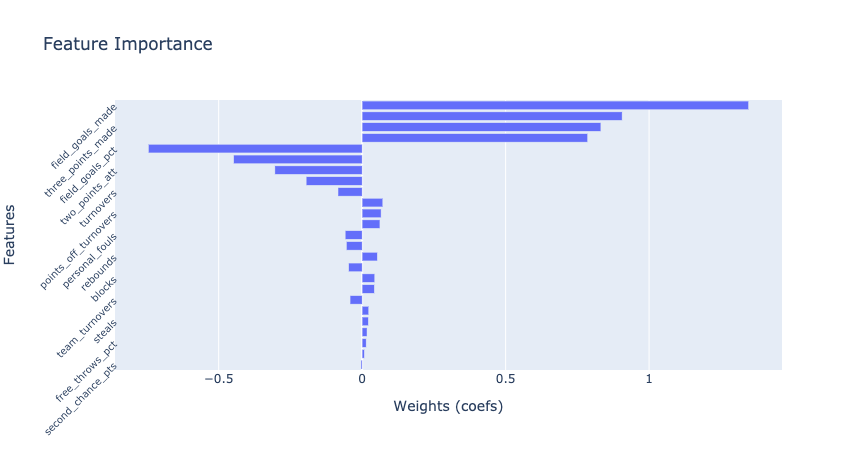

In [22]:
input_df = df.drop(columns=['index', 'points_game', 'W/L']) # dropping unneeded features 
y = df['W/L'] # seperating the column that the model will be predicting
scale = StandardScaler() # instatiating a scaler to scale features 
x = scale.fit_transform(input_df) # scales the features between 1 and 0

# splits features and predictors into train data and test data
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=.2, 
                                                random_state=0)

# using baseline model to simplify the process of feature selecting
base = LogisticRegression()
base.fit(xtrain, ytrain)

# instiating the coefficients of the features from the baseline model
feat_weights, feats = base.coef_[0], list(input_df.columns)

feature_selection(feat_weights, feats, visual=True) # renders the plot to show

In [16]:
# creating list of the wanted features
selected_feats = ['field_goals_made', 'two_points_made',
                  'free_throws_made', 'three_points_made',
                  'free_throw_att', 'team_turnovers',
                  'turnovers']

# iterates through the selected features
for col in input_df.columns:
    
    # checks if the column is in the selected_feat list
    if col not in selected_feats: 
        
        input_df.drop(columns=col, axis=1, inplace=True) # dropping the unwanted features

## Modeling

I used a technique called stacking. Stacking is a technique to essentially stack models on top of each by using info gained from each model. The advantages of stacking is that it can increase your accuracy with a great impact. Stacking usually has been used in Kaggle competitions because of how well it improves the accuracy of your model but has its drawbacks. The disadvantages to stacking is that it requires a vast amout of computation which is time and money being spent in the eyes of a business so I don't know really if it is being used in the real world. 


In [17]:
# creating a dictionary of param grids for each different model
params = {'rfc':{'criterion':['gini','entropy'], # param grid for the RandomForestClassifier
                 'n_estimators':[10,25,50,75,100],
                 'max_depth':[1,3,5,7,10],
                 'min_samples_split':[2,3,5,7]},
          
          'adc':{'n_estimators':[10,15,20,25,30], # param grid for the AdaBoostClassifier
                 'max_depth':[1,3,5,7,10]},
          
          'lr':{'C':[0.0001,0.003,0.001,0.03,0.01,0.1, # param grid for the LogisticRegression
                     1,3,5,10],
                'solver':['newton-cg', 'lbfgs', 'sag']}
         }

In [18]:
def model(x, y, _estimator, scalar=None, params=None):
    """
    
    Function that does all of the scaling, spliting,
    fitting, predicting just simplify code.
    
    Parameters
    -----------
    x : array-like, shape (n_featuers, n_observations)
        A numpy array, a dataframe, or a list works.
        Should have the same n_observations as y
    
    y : array-like, shape (1, n_observations)
        A numpy array, a series, or a list works. 
        Should have the same n_observations as x.
        
    classifier : an estimator
        An estimator from sklearn only works for this 
        fucntion. The estimator should already be 
        instantiated.
        
    Keyword Args
    -------------
    scalar : sklearn.preprocessing object
        If scaling data is desried then scalar needs
        to be set a preprocessing object from sklearn
        
    params : dict 
        If a grid search is desired then params needs
        to be set to a dict of the considerable parameters
        for the correct estimator.
        
    Returns 
    --------
    A numpy array of predicted probabilities in 
    lists [probability of false, probability of true]
    but if using a grid search it returns the best
    parameters for estimator.
    
    """
    if scalar != None: # checks if scalar was set
        
        feats = scalar.fit_transform(x) # isntantiates the scaling obj
        
    # splits the data into training and testing data
    xtrain, xtest, ytrain, ytest = train_test_split(feats, y, test_size=.2, 
                                                        random_state=0)
    if params != None: # checks if scalar was set
        
        # instantiates the grid search obj
        grid = GridSearchCV(estimator=_estimator, param_grid=params,
                            cv=5, n_jobs=4)
        
        # fits the grid search to x and y training data
        grid = grid.fit(xtrain, ytrain)
        
        return grid.best_params_ # the best parameters for the estimator
    
    else:
        
        _estimator.fit(xtrain, ytrain) # fits estimator to x and y training data
        
        return classifier.predict_proba(xtest) # returns the predicted probablities 

There were a lot of errors when running the model function so that's why the results and code weren't shown but below shows what the grid search said were the best parameters for each estimator were being used.

In [23]:
# the hyperparameters were chosen by doing a grid search before
base = LogisticRegression() # instatiating a base line estimator

# instantiating the LogisticRegression classifier
lr = LogisticRegression(C=1, solver='sag', random_state=0) 

# instantiating the RandomForsetClassifier
rfc = RandomForestClassifier(criterion='entropy', max_depth=10, 
                             min_samples_split=2, n_estimators=75)

ada = AdaBoostClassifier(n_estimators=30) # instantiating the AdaBoostClassifier

# instantiating the baseline model 
base = base.fit(xtrain, ytrain) # fitting the training data to the baseline model
base_pred = base.predict(xtest) # istantiating the baseline predictions

# instantiating the EnsembleVoteClassifier
evc = EnsembleVoteClassifier(clfs=[lr,rfc,ada], voting='soft') 
evc = evc.fit(xtrain, ytrain) # fitting x and y training data to evc
stack_pred = evc.predict(xtest) # instantiating the predictions

In [24]:
"""

A function was made in a class but for some reason
jupyter lab didn't like that I was rounding the metric
scores when using the method inside the class so just 
for the purpose of this project the function was written 
here. If you like to see it in the summary.py file. The 
method is called show_summary().

"""
def show(ytest, ypred, *args, **kwargs):
    """
    
    A function is to a visualization of a classification
    model summary. It plots the ROC curve and prints out 
    area under curve.
    
    Parameters
    -----------
    ytest : array-like, shape(n_observations,)
        The target variable/binary class values.

    ypred : array-like, shape(n_observations,)
        The predicted value or class values.
        
    Returns
    --------
    Returns nothing technically but it shows a plot
    of the ROC curve and prints out area under the 
    curve.
    
    """
    
    # instantiating a list of hex codes for the plot colors
    COLORS = ['#8D99AE','#D90429','#2B2D42','#EDF2F4'] 
    
    # instantiating false positive rate and true positive rate
    fpr, tpr, thresh = roc_curve(ytest, ypred)
    
    # instantiating accuracy
    acc = np.round(accuracy_score(ytest, ypred), 
                   decimals=2)
    
    data = [go.Scatter(x=fpr, y=tpr, # creates the ROC curve on the plot
                       name='ROC Curve',
                       line=dict(dash='solid',
                       color=COLORS[1],
                       width=4)),
            go.Scatter(x=[0,1], y=[0,1], # creates the dashed line on the plot
                       line=dict(dash='dash',
                       color=COLORS[-1],
                       width=2))]
    
    # creates the meta data and styling of the plot
    layout = go.Layout(title=f'ROC Curve\n Accuracy: {acc}',
                       plot_bgcolor=COLORS[0],
                       paper_bgcolor=COLORS[-1],
                       xaxis=dict(title='False Positive Rate'),
                       yaxis=dict(title='True Positive Rate'))

    # creats the fig for the plot
    fig = go.Figure(data=data, layout=layout)
    fig.show() # renders the plot to show
    
    # instantiates the area under the curve of the ROC curve
    auc = np.round(roc_auc_score(ytest, ypred),
                   decimals=2)
    print("AUC Score -------> ", auc) # prints auc

The ModelSummary object is from the class ModelSummary in the module summary.py. The module has methods that summarizes models that can be used to compare models. I created the module because I kept finding myself writing almost the same code for comparing models and I hadn't seen a package that does it in a way that I think makes since.

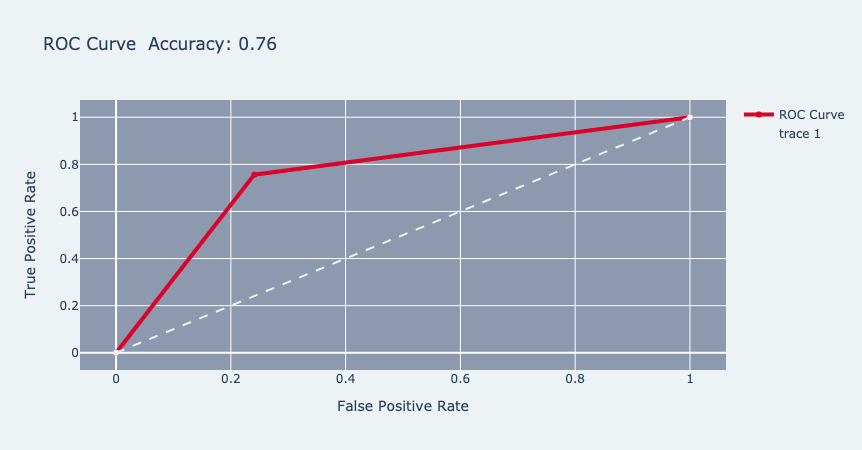

AUC Score ------->  0.76
_________________
Accuracy:  0.7575093867334167
-----------------
Confusion Matrix: 
 [[3621 1149]
 [1176 3642]]
-----------------
Classification Report: 
               precision    recall  f1-score   support

           0       0.75      0.76      0.76      4770
           1       0.76      0.76      0.76      4818

    accuracy                           0.76      9588
   macro avg       0.76      0.76      0.76      9588
weighted avg       0.76      0.76      0.76      9588

-----------------
MAE Score:  0.24249061326658322
_________________


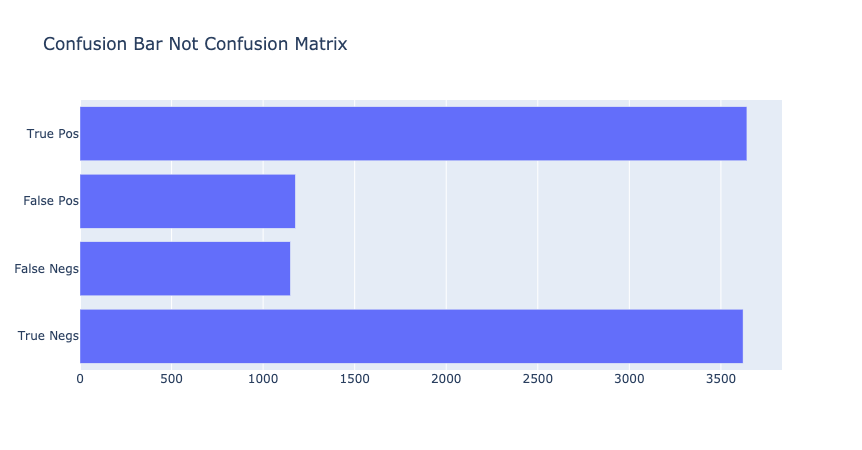

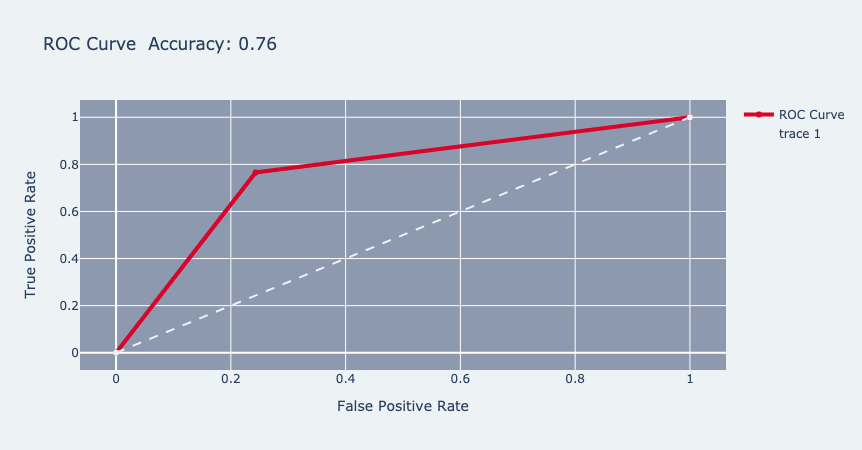

AUC Score ------->  0.76
_________________
Accuracy:  0.761159783062161
-----------------
Confusion Matrix: 
 [[3610 1160]
 [1130 3688]]
-----------------
Classification Report: 
               precision    recall  f1-score   support

           0       0.76      0.76      0.76      4770
           1       0.76      0.77      0.76      4818

    accuracy                           0.76      9588
   macro avg       0.76      0.76      0.76      9588
weighted avg       0.76      0.76      0.76      9588

-----------------
MAE Score:  0.23884021693783897
_________________


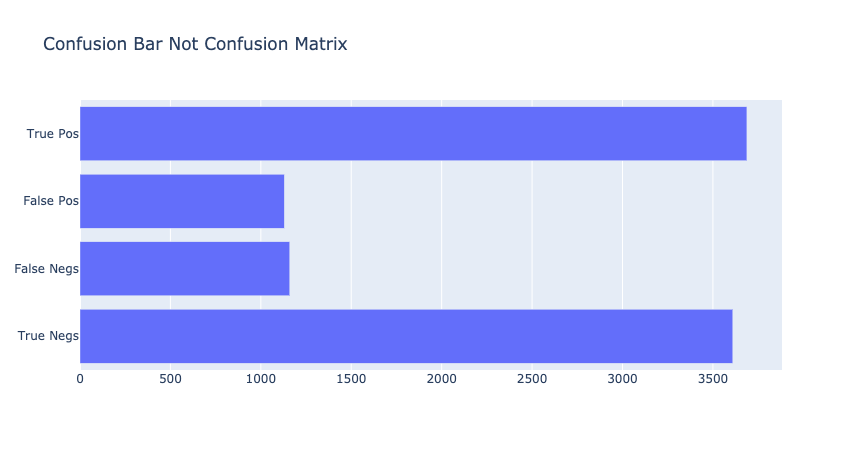

In [25]:
# Read the cell before this to get knowledge of the ModelSummary obj
# instantiating a summary obj to preview the baseline model summary
base_sum = summary.ModelSummary(ytest, base_pred) 

# instantiating a summary obj to preview the stacked model summary
stack_sum = summary.ModelSummary(ytest, stack_pred)

show(ytest, base_pred) # renders plot of the baseline summary
base_sum.report_summary(type_pred='classify') # printing the baseline summary report
base_sum.confusion_visual() # renders a bar plot of confusion matrix values

show(ytest, stack_pred) # renders plot of the stacked summary
stack_sum.report_summary(type_pred='classify') # printing the stacked summary report
stack_sum.confusion_visual() # renders a bar plot of confusion matrix values

### Conclusion

I'm going to give myself the benefit of the doubt that I did something wrong when trying to stack models because the accuracy scores and precision and recall scores are nearly the exact same. Overall the models were able to predict with an average ability to correctly predict winning or losing a game.

Since my accuracy score were similiar and this is my first try with stacking models. I manually programmed what the EnsembleVoteClassifier() does.

In [21]:
def extract_prob_feats(classifier, train, test):
    
    """
    
    A function for getting the predict_proba method
    return object to work with dataframes.
    
    Parameters
    -----------
    classifier : an estimator, type = Classifier
        The estimator needs to be from sklearn and 
        already instantiated.
    
    train : tuple, (xtrain, ytrain)
        The elements in the tuple need to be 
        array-like. Recommend using sklearn's 
        train_test_split method to get the 
        elements inside the tuple
        
    test : tuple, (xtest, ytest)
        The elements in the tuple need to be 
        array-like. Recommend using sklearn's 
        train_test_split method to get the 
        elements inside the tuple
        
    Returns
    --------
    A list of probabilities for the prediction
    being true.
    
    """
    
    classifier.fit(train[0], train[1]) # fits the training data to the estimator
    
    # instantiates the predicted probabilities
    probs = classifier.predict_proba(test[0]) 
    
    # empty for the predicted probabilities of being true
    positive_probs = [] 
    
    # iterates over the predicted probabilities
    for x in probs:
        
        # adds the predicted probability of being true
        positive_probs.append(x[1]) 
    
    return positive_probs # returns the list of the predicted true probabilities

In [22]:
# extracting the predicted probabilities from Logistic Classifier
lr_probs = extract_prob_feats(lr, (xtrain, ytrain), (xtest, ytest)) 

# extracting the predicted probabilities from Random Forest Classifier
rfc_probs = extract_prob_feats(rfc, (xtrain, ytrain), (xtest, ytest))

# extracting the predicted probablities from AdaBoost Classifier
ada_probs = extract_prob_feats(ada, (xtrain, ytrain), (xtest, ytest)) 

# instantiating a dataframe of the predicted probabilities from the stacked models
prob_df = pd.DataFrame({'lr_prob':lr_probs,
                        'rfc_prob':rfc_probs,
                        'ada_prob':ada_probs})

# your per usual split of data
xtrain, xtest, ytrain, stack_ytest = train_test_split(prob_df, ytest, test_size=.3, random_state=0) 

lr.fit(xtrain, ytrain) # fitting the new data to the logistic regression model
stack_pred = lr.predict(xtest) # instantiating the newly predicted values

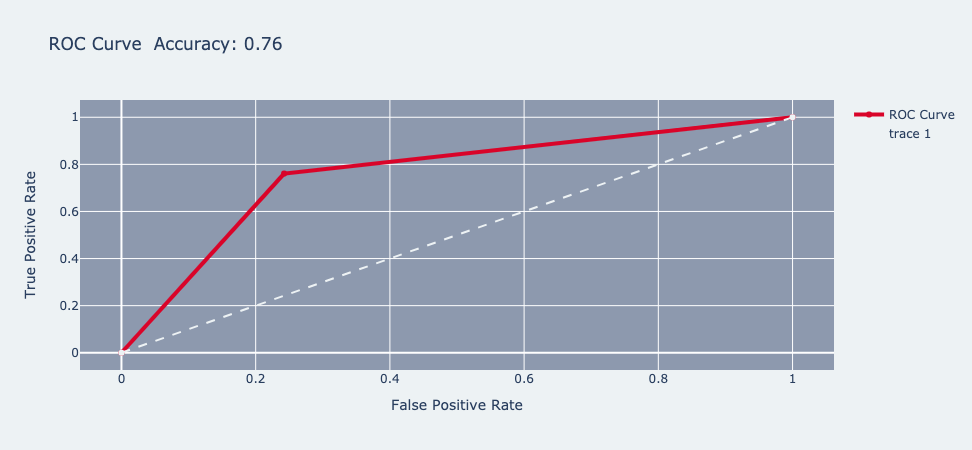

AUC Score ------->  0.76
_________________
Accuracy:  0.7592824363788069
-----------------
Confusion Matrix: 
 [[3614 1156]
 [1152 3666]]
-----------------
Classification Report: 
               precision    recall  f1-score   support

           0       0.76      0.76      0.76      4770
           1       0.76      0.76      0.76      4818

    accuracy                           0.76      9588
   macro avg       0.76      0.76      0.76      9588
weighted avg       0.76      0.76      0.76      9588

-----------------
MAE Score:  0.24071756362119315
_________________


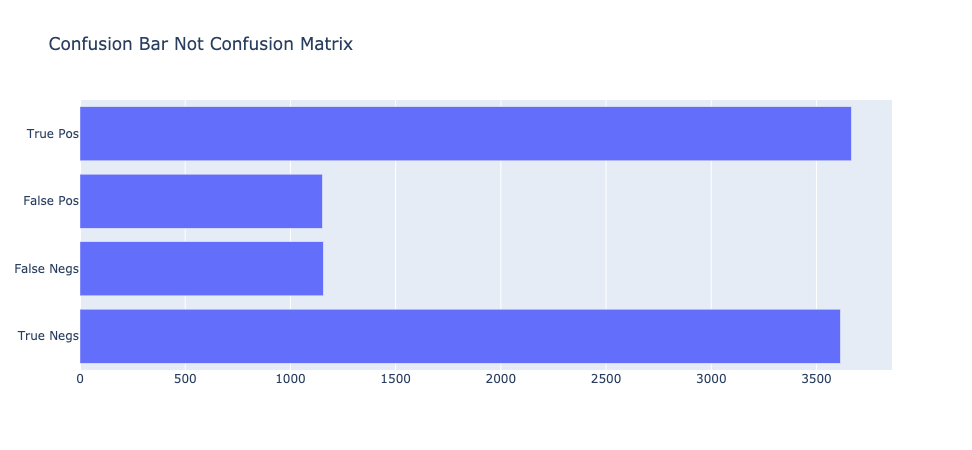

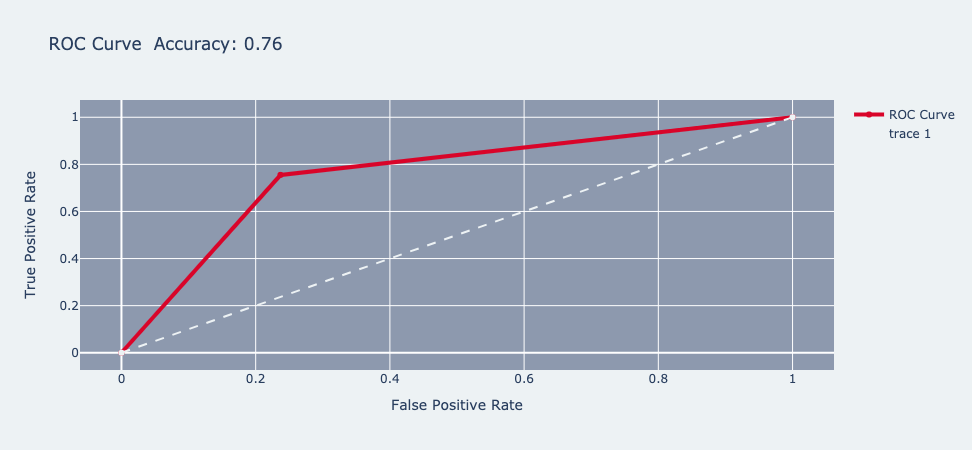

AUC Score ------->  0.76
_________________
Accuracy:  0.7591781393408428
-----------------
Confusion Matrix: 
 [[3603 1167]
 [1142 3676]]
-----------------
Classification Report: 
               precision    recall  f1-score   support

           0       0.76      0.76      0.76      4770
           1       0.76      0.76      0.76      4818

    accuracy                           0.76      9588
   macro avg       0.76      0.76      0.76      9588
weighted avg       0.76      0.76      0.76      9588

-----------------
MAE Score:  0.24082186065915728
_________________


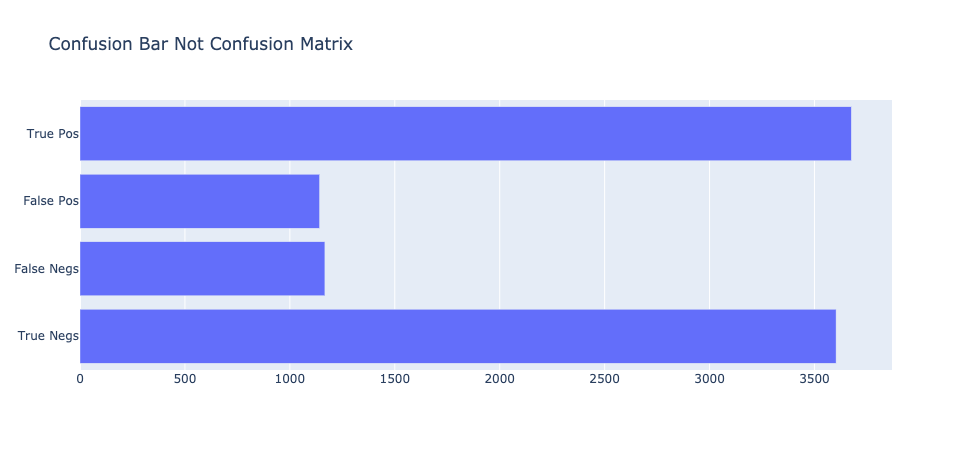

In [23]:
show(ytest, base_pred) # renders plot of the baseline summary
base_sum.report_summary(type_pred='classify') # printing the baseline summary report
base_sum.confusion_visual() # renders a bar plot of confusion matrix values

show(stack_ytest, stack_pred) # renders plot of the stacked summary
stack_sum.report_summary(type_pred='classify') # printing the stacked summary report
stack_sum.confusion_visual() # renders a bar plot of confusion matrix values

### Conclusion

The numbers didn't change. What that tells me is that I did implemented stacking technique wrongly but this is because of the lack of experience with stacking, like not knowing what type of models to stack that help when stacking. 